# Import necessary libraries

In [1]:
import os
import glob
import torch
import cv2
import random
from tqdm import tqdm
import numpy as np
from torch import nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision.transforms import v2
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

In [2]:
torch.manual_seed(42)

In [3]:
# Get cpu, gpu or mps device for training.
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [4]:
mask_paths = glob.glob('/kaggle/input/lgg-mri-segmentation/kaggle_3m/*/*_mask*')
image_paths = [i.replace('_mask', '') for i in mask_paths]
print(f'{len(mask_paths)} {len(image_paths)}')

3929 3929


# Helper functions

In [5]:
def plot_from_img_path(n_examples, list_img_paths, list_mask_paths):
    
    fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
    i = 0
    for ax in axs:
        image, mask = list_img_paths[i], list_mask_paths[i]
        image, mask = cv2.imread(image), cv2.imread(mask)
        ax[0].set_title("MRI images")
        ax[0].imshow(image)
        ax[1].set_title("Highlited abnormality")
        ax[1].imshow(image)
        ax[1].imshow(mask, alpha=0.2)
        ax[2].imshow(mask)
        ax[2].set_title("Abnormality mask")
        i += 1
 

# Visualizing images and masks

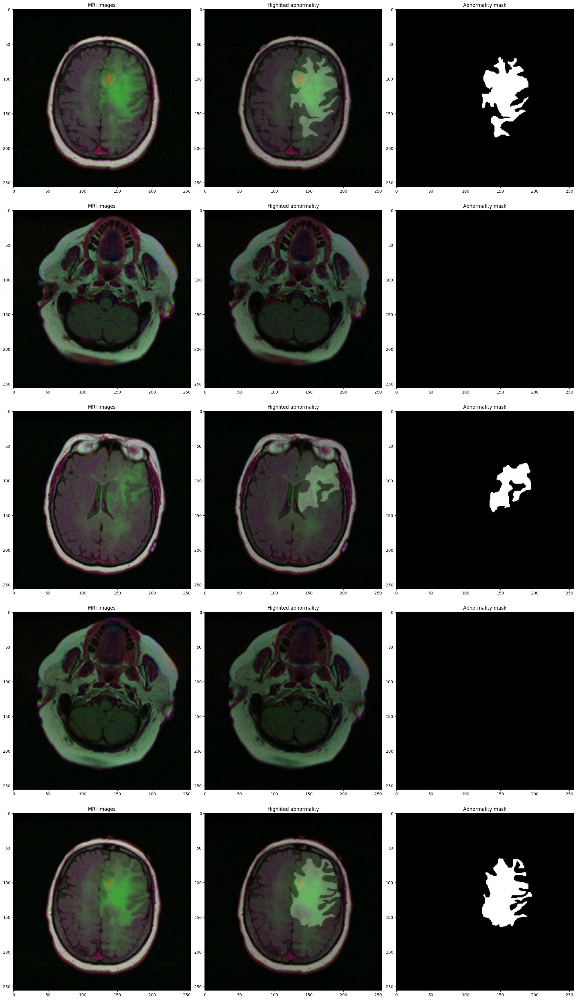

In [6]:
plot_from_img_path(n_examples=5, list_img_paths=image_paths[5:], list_mask_paths=mask_paths[5:])

# Create dataframe and split dataset into train, val and test sets

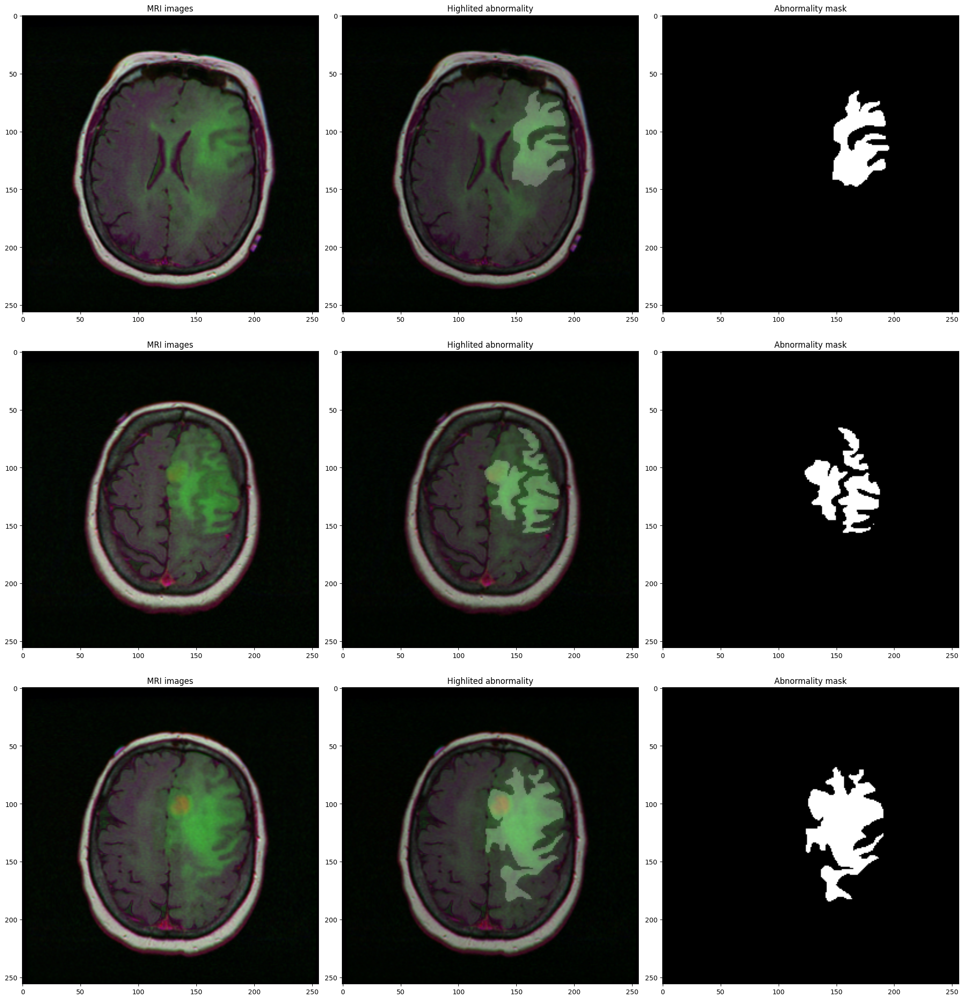

In [7]:
df = pd.DataFrame(data={'image': image_paths, 'mask': mask_paths})
df.head()
plot_from_img_path(n_examples=3, list_img_paths=df.iloc[[3,4,5],0].tolist(), list_mask_paths=df.iloc[[3,4,5],1].tolist())

In [8]:
df_train, df_test = train_test_split(df, test_size=0.3, random_state=42)
df_test, df_val = train_test_split(df_test, test_size=0.3, random_state=42)

print('train')
print(f"{df_train.describe().loc['count', ['image', 'mask']]}\n")
print('val')
print(f"{df_val.describe().loc['count', ['image', 'mask']]}\n")
print('test')
print(f"{df_test.describe().loc['count', ['image', 'mask']]}\n")

train
image    2750
mask     2750
Name: count, dtype: object

val
image    354
mask     354
Name: count, dtype: object

test
image    825
mask     825
Name: count, dtype: object



In [9]:
class MRI_Dataset(Dataset):
    def __init__(self, df, img_transform=None, mask_transform=None):
        self.image_paths = df['image']
        self.mask_paths = df['mask']
        self.img_transform = img_transform
        self.mask_transform = mask_transform
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_file = self.image_paths.iloc[idx]
        mask_file = self.mask_paths.iloc[idx]
        
        img = cv2.imread(img_file, cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)

        if self.img_transform:
            img = self.img_transform(img)
        if self.mask_transform:
            mask = self.mask_transform(mask)
        
        return img, mask

In [10]:
train_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
train_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [11]:
val_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
val_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [12]:
test_img_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])
test_mask_transform = v2.Compose([
    v2.ToTensor(),
    v2.ToDtype(torch.float32, scale=True),
])

In [13]:
train_dataset = MRI_Dataset(df_train, img_transform=train_img_transform, mask_transform=train_mask_transform)
val_dataset = MRI_Dataset(df_val, img_transform=val_img_transform, mask_transform=val_mask_transform)
test_dataset = MRI_Dataset(df_test, img_transform=test_img_transform, mask_transform=test_mask_transform)

In [14]:
batch_size = 16

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size)

In [15]:
for img, mask in train_dataloader:
    print(img.shape)
    print(mask.shape)
    break

torch.Size([16, 3, 256, 256])
torch.Size([16, 1, 256, 256])


# Building the U-Net model
Both the image and mask have the same image size (256 x 256)

In [16]:
class conv_relu(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding='same')
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding='same')
        self.batchnorm1 = nn.BatchNorm2d(out_channels)
        self.batchnorm2 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.batchnorm1(self.conv1(x)))
        x = self.relu(self.batchnorm2(self.conv2(x)))
        # print(f"conv_relu {x.shape}")
        return x


class upsample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.upconv = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, kernel_size=2, padding='same')
        )        

    def forward(self, x):
        x = self.upconv(x)
        # print(f"up {x.shape}")
        return x

def copy_crop(contract, expand):
    start_h = (contract.shape[2] - expand.shape[2]) // 2
    start_w = (contract.shape[3] - expand.shape[3]) // 2
    end_h = start_h + expand.shape[2]
    end_w = start_w + expand.shape[3]
    cropped_contract = contract[:, :, start_h:end_h, start_w:end_w]
    
    concatenated = torch.cat((cropped_contract, expand), dim=1)
    # print(f"Shape after concatenation: {concatenated.shape}")
    return concatenated
        

In [17]:
# copy_crop(torch.randn(64, 128, 280, 280), torch.randn(64, 128, 200, 200))

In [18]:
class U_Net(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.downsample = nn.MaxPool2d(kernel_size=2, stride=2)
        
        self.conv1 = conv_relu(3, 64)
        self.conv2 = conv_relu(64, 128)
        self.conv3 = conv_relu(128, 256)
        self.conv4 = conv_relu(256, 512)
        self.conv5 = conv_relu(512, 1024)

        self.upsample1 = upsample(1024, 512)
        self.conv6 = conv_relu(1024, 512)
        
        self.upsample2 = upsample(512, 256)
        self.conv7 = conv_relu(512, 256)

        self.upsample3 = upsample(256, 128)
        self.conv8 = conv_relu(256, 128)
        
        self.upsample4 = upsample(128, 64)
        self.conv9 = conv_relu(128, 64)

        self.conv1x1 = nn.Conv2d(64, num_classes, kernel_size=1, stride=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x1 = self.conv1(x)
        x = self.downsample(x1)
        x2 = self.conv2(x)
        x = self.downsample(x2)
        x3 = self.conv3(x)
        x = self.downsample(x3)
        x4 = self.conv4(x)
        x = self.downsample(x4)
        x = self.conv5(x)

        x = self.upsample1(x)
        x = copy_crop(x4, x)
        x = self.conv6(x)

        x = self.upsample2(x)
        x = copy_crop(x3, x)
        x = self.conv7(x)

        x = self.upsample3(x)
        x = copy_crop(x2, x)
        x = self.conv8(x)
        
        x = self.upsample4(x)
        x = copy_crop(x1, x)
        x = self.conv9(x)
        x = self.conv1x1(x)
        x = self.sigmoid(x)
        
        return x

In [19]:
model = U_Net(num_classes=1).to(device)
print(model)

U_Net(
  (downsample): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1): conv_relu(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (batchnorm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (batchnorm2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv2): conv_relu(
    (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (batchnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (batchnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU()
  )
  (conv3): conv_relu(
    (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (co

In [20]:
loss_fn = nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(), momentum=0.99)

# Training loop

In [21]:
def training_loop(epochs, model, train_dataloader, val_dataloader, 
                  loss_fn, optimizer):
    history = {'train_loss': [], 'val_loss': []}

    for epoch in range(1, epochs+1):
        model.train()
        running_train_loss = 0
        for data in tqdm(train_dataloader):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            pred = model(img)
            loss = loss_fn(pred, mask)
            running_train_loss += loss.item()
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        model.eval()
        with torch.no_grad():
            running_val_loss = 0
            for data in tqdm(val_dataloader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                pred = model(img)
                loss = loss_fn(pred, mask)
                running_val_loss += loss.item()

        train_loss = running_train_loss / len(train_dataloader.dataset)
        val_loss = running_val_loss / len(val_dataloader.dataset)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss}')
        
    model.eval()
    return history

In [22]:
epochs = 90
history = training_loop(epochs, model, train_dataloader, val_dataloader, 
                        loss_fn, optimizer)

  0%|          | 0/172 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:454: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:1031.)
  return F.conv2d(input, weight, bias, self.stride,
100%|██████████| 23/23 [00:10<00:00,  2.27it/s]


Epoch: 1/90 | Training loss: 0.006926013091748411 | Validation loss: 0.00202129110378229


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 2/90 | Training loss: 0.0016373696413568475 | Validation loss: 0.0017476080217014597


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 3/90 | Training loss: 0.0014199499823153018 | Validation loss: 0.00149940220523352


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 4/90 | Training loss: 0.0012443349346179854 | Validation loss: 0.001260931866038275


100%|██████████| 23/23 [00:04<00:00,  4.73it/s]


Epoch: 5/90 | Training loss: 0.0010820183349265293 | Validation loss: 0.0012124709194357701


100%|██████████| 23/23 [00:04<00:00,  4.64it/s]


Epoch: 6/90 | Training loss: 0.0009803419453515247 | Validation loss: 0.0011082431286676014


100%|██████████| 23/23 [00:04<00:00,  4.75it/s]


Epoch: 7/90 | Training loss: 0.0008990734198384664 | Validation loss: 0.001113285534846791


100%|██████████| 23/23 [00:04<00:00,  4.74it/s]


Epoch: 8/90 | Training loss: 0.0008549871942959726 | Validation loss: 0.000981315254170637


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 9/90 | Training loss: 0.0008134517752650109 | Validation loss: 0.001051855857750617


100%|██████████| 23/23 [00:04<00:00,  4.72it/s]


Epoch: 10/90 | Training loss: 0.0007606193633665415 | Validation loss: 0.000915149680977111


100%|██████████| 23/23 [00:04<00:00,  4.75it/s]


Epoch: 11/90 | Training loss: 0.0007235807866196741 | Validation loss: 0.0008887505792817995


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 12/90 | Training loss: 0.0006775910843756388 | Validation loss: 0.0009152787924339037


100%|██████████| 23/23 [00:04<00:00,  4.74it/s]


Epoch: 13/90 | Training loss: 0.000648681071840904 | Validation loss: 0.000850928984819201


100%|██████████| 23/23 [00:04<00:00,  4.67it/s]


Epoch: 14/90 | Training loss: 0.0006234083440239456 | Validation loss: 0.0008027657029866162


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 15/90 | Training loss: 0.0005993131770837036 | Validation loss: 0.0007474309893714337


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 16/90 | Training loss: 0.0005730004641650752 | Validation loss: 0.0007637593027775335


100%|██████████| 23/23 [00:04<00:00,  4.76it/s]


Epoch: 17/90 | Training loss: 0.0005393460675312037 | Validation loss: 0.0007937619394207068


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 18/90 | Training loss: 0.0005182182583322917 | Validation loss: 0.0007178371820604514


100%|██████████| 23/23 [00:04<00:00,  4.76it/s]


Epoch: 19/90 | Training loss: 0.000495961008393682 | Validation loss: 0.0006669741091517181


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 20/90 | Training loss: 0.00047247348478148606 | Validation loss: 0.0006999234980666789


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 21/90 | Training loss: 0.00046071375349790537 | Validation loss: 0.0007267502218084988


100%|██████████| 23/23 [00:04<00:00,  4.69it/s]


Epoch: 22/90 | Training loss: 0.00044524027711965823 | Validation loss: 0.0007241124860773989


100%|██████████| 23/23 [00:04<00:00,  4.72it/s]


Epoch: 23/90 | Training loss: 0.00042579151567241006 | Validation loss: 0.0007237628316717212


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 24/90 | Training loss: 0.0004182830590712415 | Validation loss: 0.0006831926484408099


100%|██████████| 23/23 [00:04<00:00,  4.74it/s]


Epoch: 25/90 | Training loss: 0.0004014129348056899 | Validation loss: 0.0007250197665860592


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 26/90 | Training loss: 0.00038867530482821166 | Validation loss: 0.0006825092484080101


100%|██████████| 23/23 [00:04<00:00,  4.72it/s]


Epoch: 27/90 | Training loss: 0.00037984870171005076 | Validation loss: 0.0006909333611567213


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 28/90 | Training loss: 0.00037030764840892513 | Validation loss: 0.000627090990027718


100%|██████████| 23/23 [00:05<00:00,  4.57it/s]


Epoch: 29/90 | Training loss: 0.0003558024480007589 | Validation loss: 0.0005872536895896629


100%|██████████| 23/23 [00:05<00:00,  4.59it/s]


Epoch: 30/90 | Training loss: 0.0003438573642210527 | Validation loss: 0.0006146392394330794


100%|██████████| 23/23 [00:04<00:00,  4.74it/s]


Epoch: 31/90 | Training loss: 0.00033506720737469466 | Validation loss: 0.0005633140199433448


100%|██████████| 23/23 [00:04<00:00,  4.67it/s]


Epoch: 32/90 | Training loss: 0.0003239083119075407 | Validation loss: 0.0006336510979891413


100%|██████████| 23/23 [00:04<00:00,  4.74it/s]


Epoch: 33/90 | Training loss: 0.00031560405890393835 | Validation loss: 0.0006248443797492162


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 34/90 | Training loss: 0.0003108322269875895 | Validation loss: 0.0006706951749063818


100%|██████████| 23/23 [00:04<00:00,  4.75it/s]


Epoch: 35/90 | Training loss: 0.00030100643291900103 | Validation loss: 0.0005909850479545608


100%|██████████| 23/23 [00:04<00:00,  4.74it/s]


Epoch: 36/90 | Training loss: 0.00029192553281609437 | Validation loss: 0.0005515276824024185


100%|██████████| 23/23 [00:04<00:00,  4.72it/s]


Epoch: 37/90 | Training loss: 0.0002884892933493988 | Validation loss: 0.0005846803604709353


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 38/90 | Training loss: 0.0002812533257952468 | Validation loss: 0.0005420668459744692


100%|██████████| 23/23 [00:04<00:00,  4.73it/s]


Epoch: 39/90 | Training loss: 0.0002722791184523058 | Validation loss: 0.0005396424934444265


100%|██████████| 23/23 [00:04<00:00,  4.60it/s]


Epoch: 40/90 | Training loss: 0.00026707538319963286 | Validation loss: 0.0006003421499449128


100%|██████████| 23/23 [00:04<00:00,  4.65it/s]


Epoch: 41/90 | Training loss: 0.00026256760719909586 | Validation loss: 0.0006824753220564039


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 42/90 | Training loss: 0.0002559739428953352 | Validation loss: 0.000579981643727607


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 43/90 | Training loss: 0.00025430205549028785 | Validation loss: 0.0005449932025732193


100%|██████████| 23/23 [00:04<00:00,  4.73it/s]


Epoch: 44/90 | Training loss: 0.000245043389639415 | Validation loss: 0.0005880163174838165


100%|██████████| 23/23 [00:04<00:00,  4.69it/s]


Epoch: 45/90 | Training loss: 0.00023990823252295905 | Validation loss: 0.0005455173907694959


100%|██████████| 23/23 [00:04<00:00,  4.61it/s]


Epoch: 46/90 | Training loss: 0.00024089309662072496 | Validation loss: 0.0005284518024510583


100%|██████████| 23/23 [00:05<00:00,  4.53it/s]


Epoch: 47/90 | Training loss: 0.0002339082120253641 | Validation loss: 0.0005226543572837208


100%|██████████| 23/23 [00:05<00:00,  4.60it/s]


Epoch: 48/90 | Training loss: 0.00022827066100117836 | Validation loss: 0.0005736806378990877


100%|██████████| 23/23 [00:04<00:00,  4.61it/s]


Epoch: 49/90 | Training loss: 0.0002210492990614677 | Validation loss: 0.0005719293559467983


100%|██████████| 23/23 [00:05<00:00,  4.58it/s]


Epoch: 50/90 | Training loss: 0.00021802937048910693 | Validation loss: 0.0006013407448983221


100%|██████████| 23/23 [00:04<00:00,  4.67it/s]


Epoch: 51/90 | Training loss: 0.000214610692568716 | Validation loss: 0.0005963643188035842


100%|██████████| 23/23 [00:04<00:00,  4.69it/s]


Epoch: 52/90 | Training loss: 0.0002109367749018764 | Validation loss: 0.000523400951063755


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 53/90 | Training loss: 0.00020765923501246355 | Validation loss: 0.0006323898971438576


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 54/90 | Training loss: 0.00020941044576466082 | Validation loss: 0.0006292854951389429


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 55/90 | Training loss: 0.00020750487078277562 | Validation loss: 0.0005089135843494876


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 56/90 | Training loss: 0.00020955838931893762 | Validation loss: 0.00050579178140893


100%|██████████| 23/23 [00:05<00:00,  4.58it/s]


Epoch: 57/90 | Training loss: 0.00020134174836460838 | Validation loss: 0.0005726599354263379


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 58/90 | Training loss: 0.00019510578878477892 | Validation loss: 0.0005086752031213294


100%|██████████| 23/23 [00:04<00:00,  4.64it/s]


Epoch: 59/90 | Training loss: 0.0001949825801553247 | Validation loss: 0.0005432557499451868


100%|██████████| 23/23 [00:04<00:00,  4.72it/s]


Epoch: 60/90 | Training loss: 0.0001883789531844245 | Validation loss: 0.0005603329164137893


100%|██████████| 23/23 [00:04<00:00,  4.67it/s]


Epoch: 61/90 | Training loss: 0.00018431442557696506 | Validation loss: 0.0005248140689865854


100%|██████████| 23/23 [00:04<00:00,  4.69it/s]


Epoch: 62/90 | Training loss: 0.00018043371850878678 | Validation loss: 0.0005700805870353081


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 63/90 | Training loss: 0.0001770393739147535 | Validation loss: 0.000562971095438773


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 64/90 | Training loss: 0.00017554086246739396 | Validation loss: 0.0005723890601671307


100%|██████████| 23/23 [00:04<00:00,  4.69it/s]


Epoch: 65/90 | Training loss: 0.00017231859774752097 | Validation loss: 0.0006368142015979451


100%|██████████| 23/23 [00:04<00:00,  4.70it/s]


Epoch: 66/90 | Training loss: 0.00017009608101480725 | Validation loss: 0.0005894250060184359


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 67/90 | Training loss: 0.0001703227811958641 | Validation loss: 0.0006277762360983965


100%|██████████| 23/23 [00:04<00:00,  4.73it/s]


Epoch: 68/90 | Training loss: 0.0001673017592534465 | Validation loss: 0.0005898429848159427


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 69/90 | Training loss: 0.00016562988285229288 | Validation loss: 0.0006410841445969996


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 70/90 | Training loss: 0.0001635749188929119 | Validation loss: 0.000574963747690702


100%|██████████| 23/23 [00:04<00:00,  4.64it/s]


Epoch: 71/90 | Training loss: 0.00016033626745708964 | Validation loss: 0.0006082803981068233


100%|██████████| 23/23 [00:04<00:00,  4.73it/s]


Epoch: 72/90 | Training loss: 0.00015910639690065926 | Validation loss: 0.0005541481314447977


100%|██████████| 23/23 [00:05<00:00,  4.49it/s]


Epoch: 73/90 | Training loss: 0.00015684955105693503 | Validation loss: 0.0005337702262341597


100%|██████████| 23/23 [00:05<00:00,  4.57it/s]


Epoch: 74/90 | Training loss: 0.00015600464223561257 | Validation loss: 0.0005663083803755794


100%|██████████| 23/23 [00:05<00:00,  4.55it/s]


Epoch: 75/90 | Training loss: 0.00015496156314938244 | Validation loss: 0.0005789059202886735


100%|██████████| 23/23 [00:04<00:00,  4.65it/s]


Epoch: 76/90 | Training loss: 0.00015184409567419523 | Validation loss: 0.0005498135224886444


100%|██████████| 23/23 [00:04<00:00,  4.62it/s]


Epoch: 77/90 | Training loss: 0.00015004849557722497 | Validation loss: 0.000572125005167585


100%|██████████| 23/23 [00:04<00:00,  4.69it/s]


Epoch: 78/90 | Training loss: 0.00014690513015640054 | Validation loss: 0.0005899052075773845


100%|██████████| 23/23 [00:04<00:00,  4.62it/s]


Epoch: 79/90 | Training loss: 0.00014595261644783684 | Validation loss: 0.0005903705506648679


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 80/90 | Training loss: 0.00014308561192328027 | Validation loss: 0.0006084692786779191


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 81/90 | Training loss: 0.00014276617541062562 | Validation loss: 0.0005427313048397796


100%|██████████| 23/23 [00:04<00:00,  4.77it/s]


Epoch: 82/90 | Training loss: 0.00014117144573141228 | Validation loss: 0.0005547736447809611


100%|██████████| 23/23 [00:04<00:00,  4.68it/s]


Epoch: 83/90 | Training loss: 0.00013994094452143393 | Validation loss: 0.0005750911712229576


100%|██████████| 23/23 [00:04<00:00,  4.66it/s]


Epoch: 84/90 | Training loss: 0.00013812766660174186 | Validation loss: 0.0006361348616317083


100%|██████████| 23/23 [00:04<00:00,  4.71it/s]


Epoch: 85/90 | Training loss: 0.00013843786136501216 | Validation loss: 0.0005912247309779405


100%|██████████| 23/23 [00:04<00:00,  4.75it/s]


Epoch: 86/90 | Training loss: 0.0001356462642486969 | Validation loss: 0.000608680586956736


100%|██████████| 23/23 [00:04<00:00,  4.61it/s]


Epoch: 87/90 | Training loss: 0.00013354985893767495 | Validation loss: 0.0006066022610481261


100%|██████████| 23/23 [00:04<00:00,  4.64it/s]


Epoch: 88/90 | Training loss: 0.000131350855152546 | Validation loss: 0.000604032252725782


100%|██████████| 23/23 [00:04<00:00,  4.75it/s]


Epoch: 89/90 | Training loss: 0.00013067652588837186 | Validation loss: 0.0005866015071968817


100%|██████████| 23/23 [00:04<00:00,  4.67it/s]

Epoch: 90/90 | Training loss: 0.00013005871279165147 | Validation loss: 0.000558590557950782


## Plot results

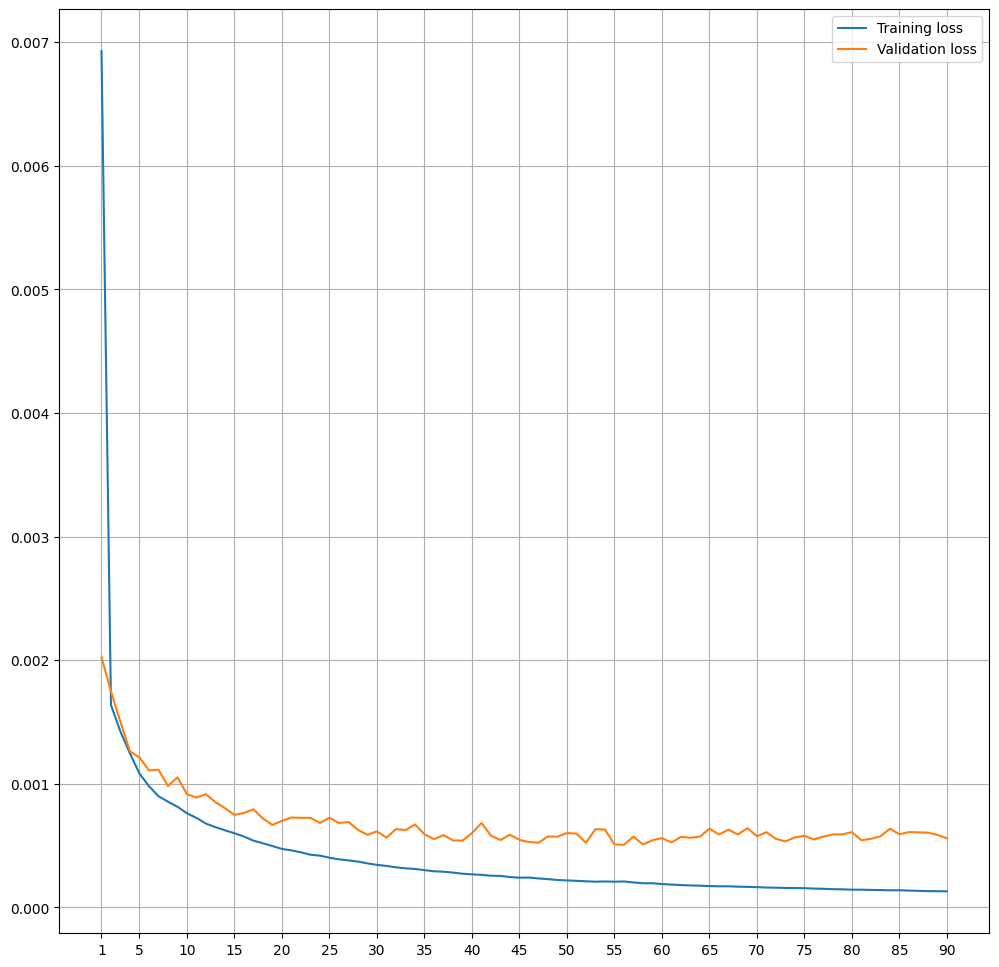

In [23]:
plt.figure(figsize=(12, 12))
plt.plot(np.arange(1,epochs+1), history['train_loss'], label='Training loss')
plt.plot(np.arange(1,epochs+1), history['val_loss'], label='Validation loss')
plt.xticks([1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90])
plt.grid()
plt.legend()
plt.show()

# Test set evaluation

In [24]:
def test_set_evaluation(models):
    for key, model in models.items():
        with torch.no_grad():
            running_loss = 0
            for i, data in enumerate(test_dataloader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                loss = loss_fn(predictions, mask)
                running_loss += loss.item() * img.size(0)
            loss = running_loss / len(test_dataset)
            
            print(f'Test loss with {key}: {loss}')

In [31]:
test_set_evaluation({"current_model": model})

Test loss with current_model: 0.009386532656622655


In [26]:
torch.save(model.state_dict(), "/kaggle/working/model_100_epochs.plt")

In [32]:
torch.save(model.state_dict(), "unet_model.pth")

In [36]:
def visualize_segmentation(model, dataloader, num_examples=1):
    model.eval()  

    # Get all indices of the dataset and randomly sample 'num_examples' indices
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  # Access the dataset by index
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  # Add batch dimension

        with torch.no_grad():
            pred = model(img)

        # Squeeze to remove batch and channel dimensions
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  # Convert to HWC format for display
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5

        # Plot
        fig, axes = plt.subplots(1, 4, figsize=(12, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()


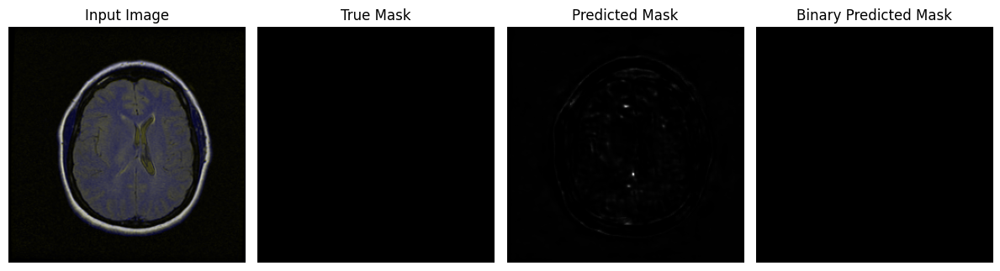

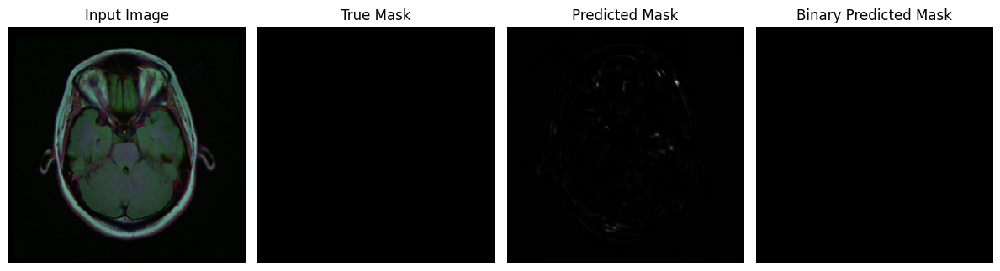

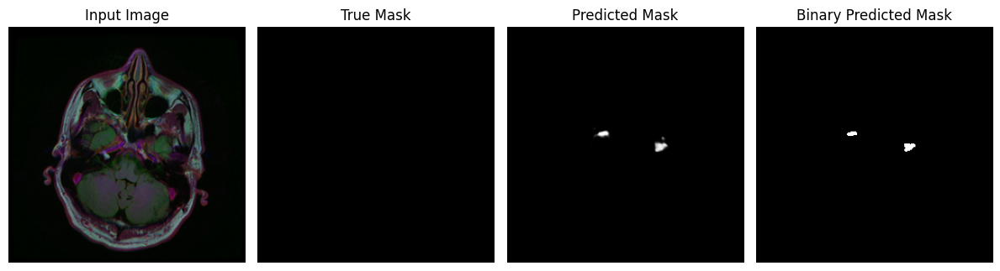

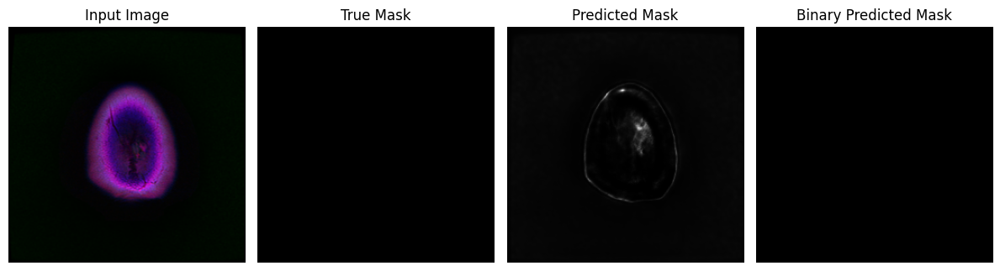

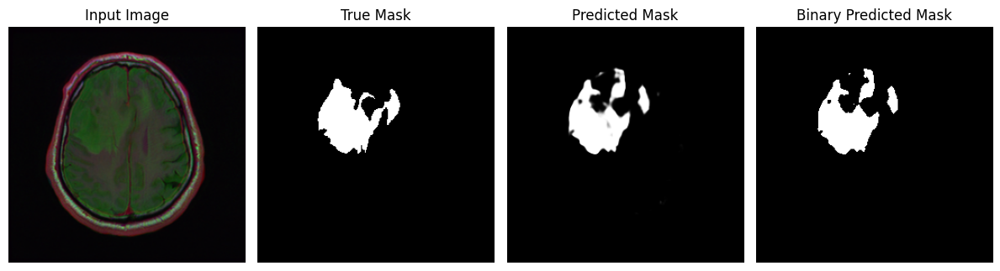

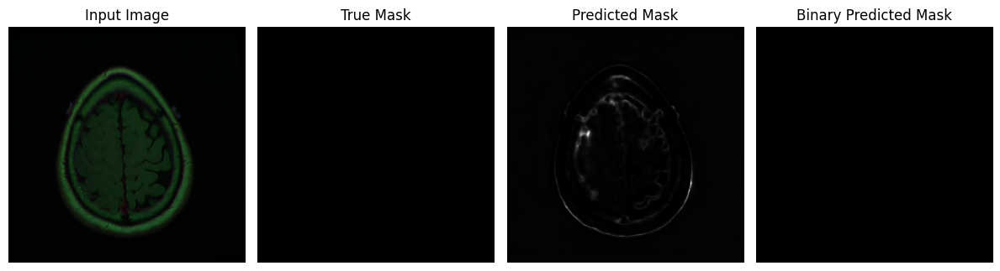

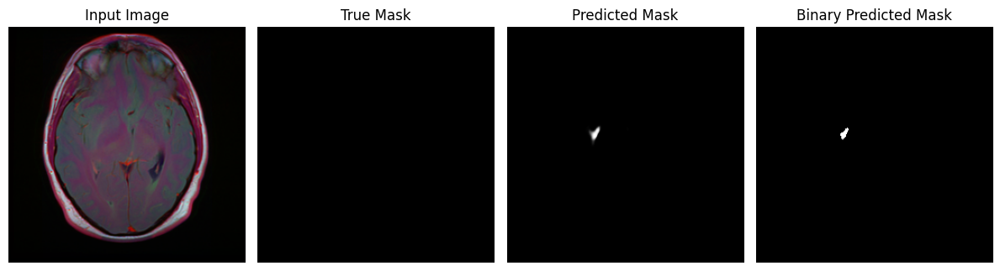

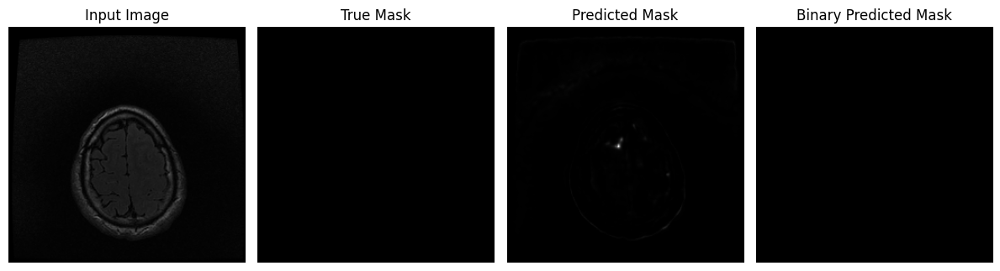

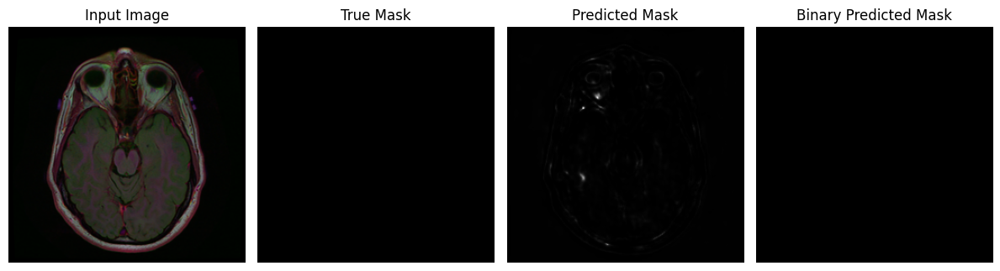

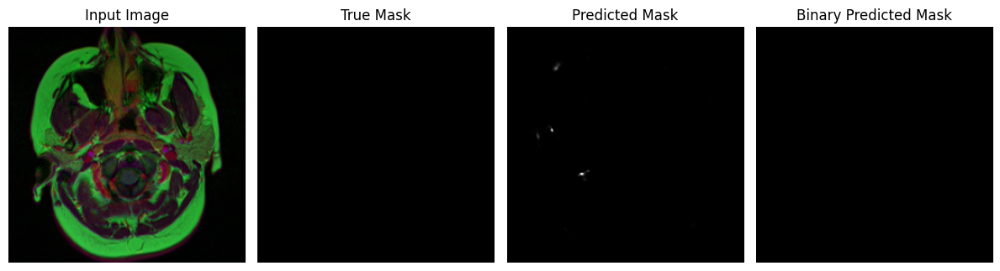

In [28]:
visualize_segmentation(model, test_dataloader, 10)

# Models benchmarking with different epochs

In [44]:
from skimage.segmentation import mark_boundaries

def dice_score(pred, target, epsilon=1e-6):
    """Computes Dice Similarity Coefficient (DSC)."""
    pred = pred > 0.5  # Convert to binary mask
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    return (2. * intersection + epsilon) / (np.sum(pred) + np.sum(target) + epsilon)

def iou_score(pred, target, epsilon=1e-6):
    """Computes Intersection over Union (IoU)."""
    pred = pred > 0.5
    target = target > 0.5
    
    intersection = np.sum(pred * target)
    union = np.sum(pred) + np.sum(target) - intersection
    return (intersection + epsilon) / (union + epsilon)

def visualize_segmentation_new(model, dataloader, num_examples=1, device='cuda'):
    model.eval()
    dataset_size = len(dataloader.dataset)
    random_indices = random.sample(range(dataset_size), num_examples)

    for idx in random_indices:
        img, mask = dataloader.dataset[idx]  
        img, mask = img.to(device).unsqueeze(0), mask.to(device).unsqueeze(0)  

        with torch.no_grad():
            pred = model(img)

        # Convert tensors to numpy arrays
        img = img.squeeze(0).permute(1, 2, 0).cpu().numpy()  
        mask = mask.squeeze(0).squeeze(0).cpu().numpy()
        pred = pred.squeeze(0).squeeze(0).cpu().numpy()
        binary_pred = pred > 0.5  

        # Compute Dice and IoU scores
        dice = dice_score(binary_pred, mask)
        iou = iou_score(binary_pred, mask)

        # Normalize image for display
        img = (img - img.min()) / (img.max() - img.min())

        # Convert masks to integer type for mark_boundaries
        mask_int = mask.astype(int)
        binary_pred_int = binary_pred.astype(int)

        # Overlay segmentation boundaries on MRI image
        img_gt_overlay = mark_boundaries(img, mask_int, color=(0, 1, 0))  
        img_pred_overlay = mark_boundaries(img_gt_overlay, binary_pred_int, color=(1, 0, 0))  

        # Plot results
        fig, axes = plt.subplots(1, 5, figsize=(15, 4))
        axes[0].imshow(img, cmap='gray' if img.shape[-1] == 1 else None)
        axes[0].set_title('Input Image')
        axes[0].axis('off')

        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('True Mask')
        axes[1].axis('off')

        axes[2].imshow(pred, cmap='gray')
        axes[2].set_title('Predicted Mask')
        axes[2].axis('off')

        axes[3].imshow(binary_pred, cmap='gray')
        axes[3].set_title('Binary Predicted Mask')
        axes[3].axis('off')

        axes[4].imshow(img_pred_overlay)
        axes[4].set_title(f'Overlay: GT (Green) & Pred (Red)\nDice: {dice:.4f}, IoU: {iou:.4f}')
        axes[4].axis('off')

        print(dice, iou)
        plt.tight_layout()
        plt.show()


1.0 1.0


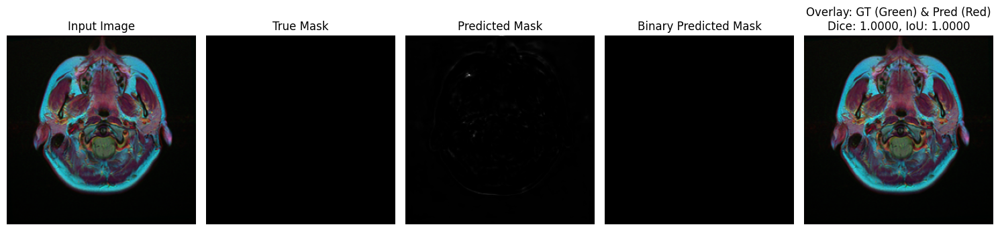

0.828418230793005 0.7070938221805634


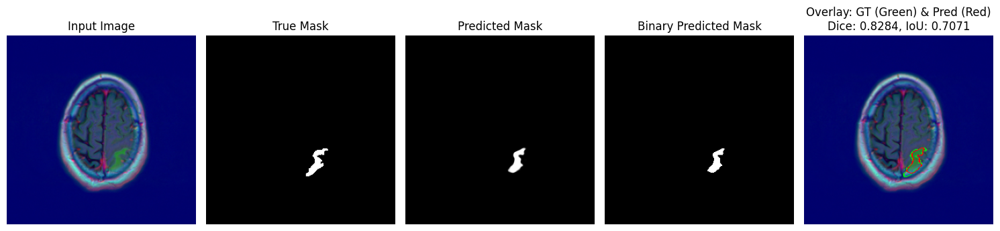

1.0 1.0


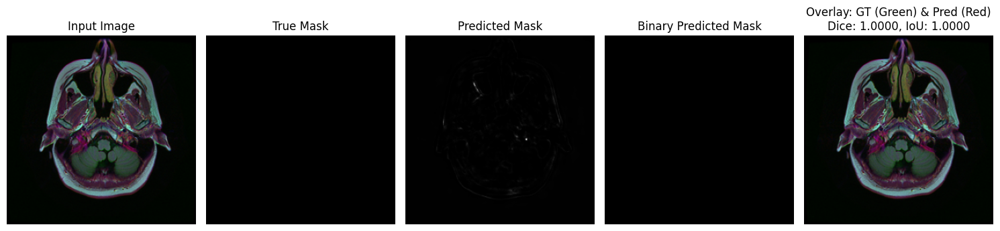

1.0 1.0


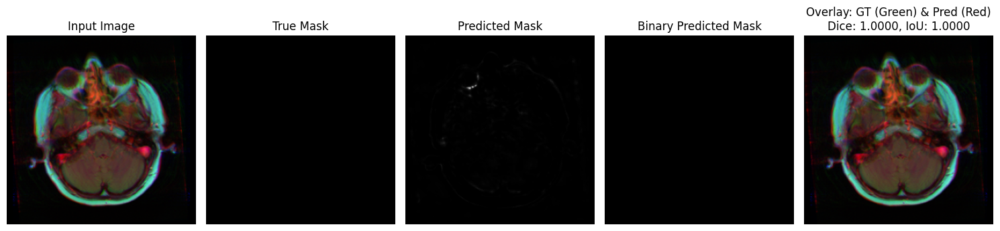

1.0 1.0


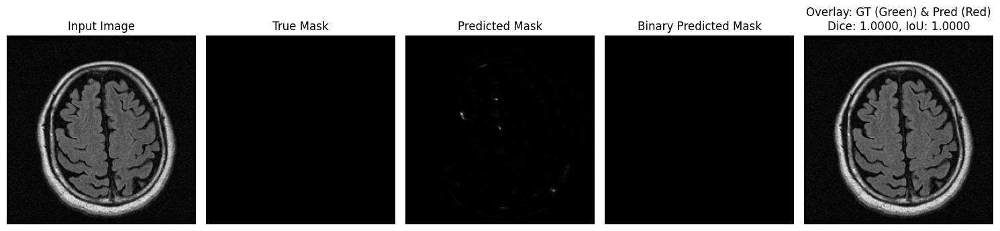

1.0 1.0


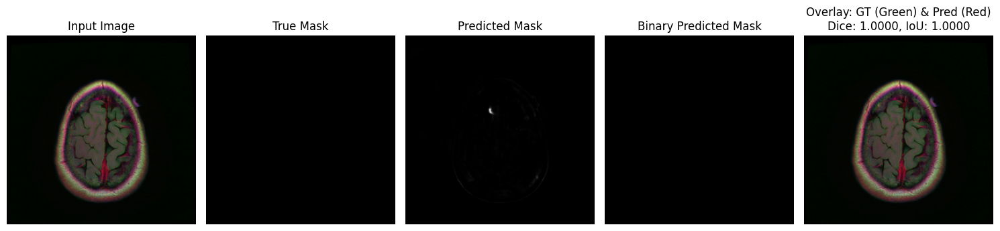

1.0 1.0


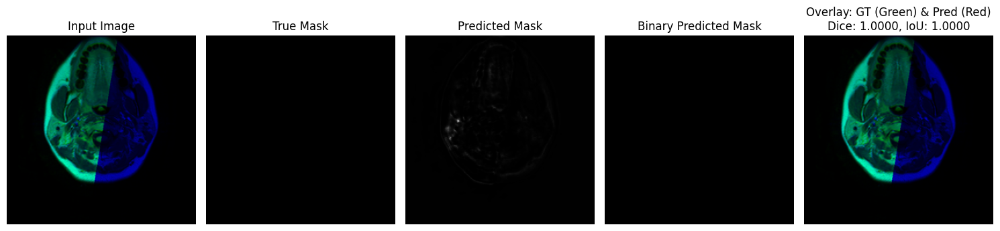

1.0 1.0


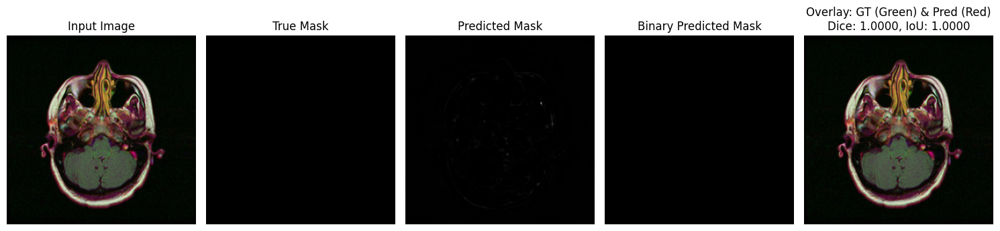

1.0 1.0


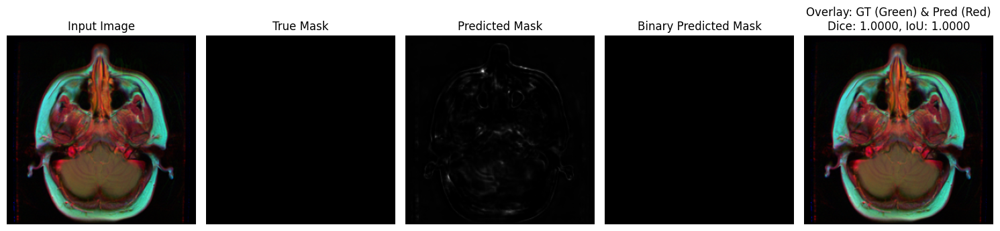

2.173913038752363e-09 2.173913038752363e-09


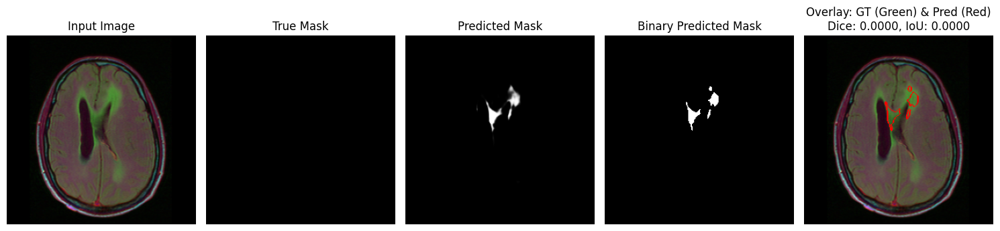

In [45]:
visualize_segmentation_new(model, test_dataloader, 10)